In [1]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/yolov9-main

Mounted at /content/gdrive
/content/gdrive/.shortcut-targets-by-id/1FsxtjdRhKCSS4b319zT5rcL3Dd5sOLs5/yolov9-main


In [ ]:
import cv2
import numpy as np
instance_path = "datasets/PhenoBench/train/plant_instances/05-26_00193_P0034119.png"
semantic_path = "datasets/PhenoBench/train/semantics/05-26_00193_P0034119.png"

instance_mask = cv2.imread(instance_path, cv2.IMREAD_UNCHANGED)
semantic_mask = cv2.imread(semantic_path, cv2.IMREAD_UNCHANGED)

print("Instance mask shape:", instance_mask.shape, "Unique vals:", np.unique(instance_mask))
print("Semantic mask shape:", semantic_mask.shape, "Unique vals:", np.unique(semantic_mask))

if semantic_mask.ndim == 3:
    print("Semantic mask channels:", semantic_mask.shape[2])
    semantic_mask_gray = semantic_mask[:, :, 0]
    print("Unique vals in semantic_mask_gray:", np.unique(semantic_mask_gray))

Instance mask shape: (1024, 1024) Unique vals: [   0  229  235  236  237  238  315  335  336  337  338  342  517 1263
 1265]
Semantic mask shape: (1024, 1024) Unique vals: [0 1 2 3]


In [ ]:
!ls /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/train | wc -l
!ls /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/train/labels | wc -l

1407
1407


In [ ]:
!ls /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val | wc -l
!ls /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/valid/labels | wc -l

772
772


In [ ]:
import os
import json
import cv2
import numpy as np
from glob import glob
from tqdm import tqdm

# === User config ===
output_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations"
os.makedirs(output_dir, exist_ok=True)

# Base image and label directories
image_dirs = {
    "train": "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/train",
    "val":   "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val"
}
label_dirs = {
    "train": "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/train/labels",
    "val":   "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/valid/labels"
}

class_names = ["crop", "weed"]

def convert_to_coco(split):
    image_dir = image_dirs[split]
    label_dir = label_dirs[split]

    image_paths = sorted(glob(os.path.join(image_dir, "*.png")) + glob(os.path.join(image_dir, "*.jpg")))
    images = []
    annotations = []
    ann_id = 0

    for img_id, img_path in enumerate(tqdm(image_paths, desc=f"[{split}] Processing images")):
        filename = os.path.basename(img_path)
        name = os.path.splitext(filename)[0]
        label_path = os.path.join(label_dir, f"{name}.txt")

        img = cv2.imread(img_path)
        if img is None:
            print(f"⚠️ Image load failed: {img_path}")
            continue
        height, width = img.shape[:2]

        images.append({
            "id": img_id,
            "file_name": filename,
            "width": width,
            "height": height
        })

        if not os.path.exists(label_path):
            continue

        with open(label_path, "r") as f:
            lines = f.readlines()

        for line in lines:
            parts = line.strip().split()
            if len(parts) < 7:
                continue

            try:
                cls_id = int(parts[0])
                coords = list(map(float, parts[1:]))

                if len(coords) % 2 != 0:
                    continue

                coords_np = np.array(coords).reshape(-1, 2)
                coords_np = np.clip(coords_np, 0, 1)
                abs_coords = (coords_np * np.array([width, height])).astype(np.float32)
                abs_coords_flat = abs_coords.flatten().tolist()

                if len(abs_coords) < 3:
                    continue

                x_min, y_min = abs_coords.min(axis=0)
                x_max, y_max = abs_coords.max(axis=0)
                bbox = [float(x_min), float(y_min), float(x_max - x_min), float(y_max - y_min)]
                area = float((x_max - x_min) * (y_max - y_min))

                annotations.append({
                    "id": ann_id,
                    "image_id": img_id,
                    "category_id": cls_id,
                    "segmentation": [abs_coords_flat],
                    "area": area,
                    "bbox": bbox,
                    "iscrowd": 0
                })
                ann_id += 1
            except Exception as e:
                print(f"❌ Error in {label_path}: {e}")
                continue

    coco_dict = {
        "info": {
            "description": f"PhenoBench {split} in COCO instance format"
        },
        "licenses": [],
        "images": images,
        "annotations": annotations,
        "categories": [
            {"id": i, "name": name, "supercategory": "plant"} for i, name in enumerate(class_names)
        ]
    }

    out_json = os.path.join(output_dir, f"instances_{split}.json")
    with open(out_json, "w") as f:
        json.dump(coco_dict, f)
    print(f"✅ Saved: {out_json} — {len(images)} images, {len(annotations)} instances")

# Run for both splits
convert_to_coco("train")
convert_to_coco("val")

[train] Processing images: 100%|██████████| 1407/1407 [21:03<00:00,  1.11it/s]


✅ Saved: /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_train.json — 1407 images, 23253 instances


[val] Processing images: 100%|██████████| 772/772 [11:15<00:00,  1.14it/s]


✅ Saved: /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_val.json — 772 images, 11874 instances


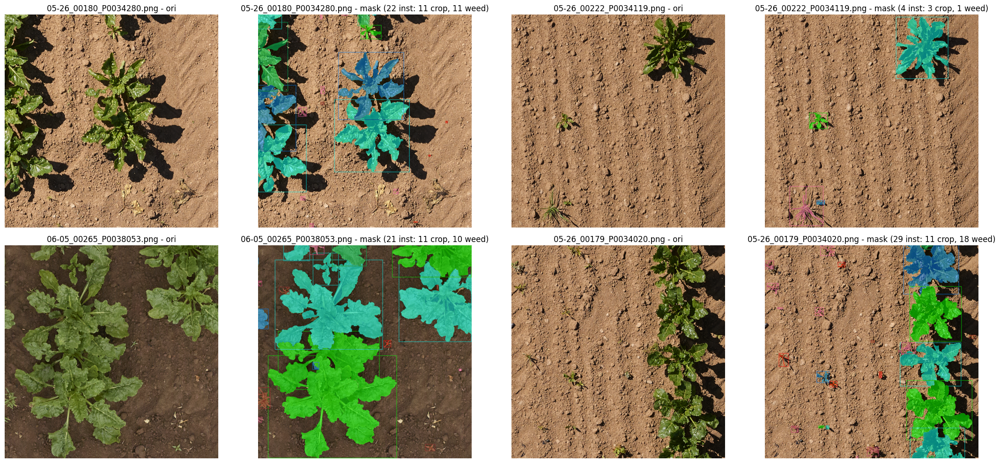

In [ ]:
import os
import json
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob

# --- Paths ---
image_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/train"
json_path = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_train.json"

# --- Colors per class ---
CROP_COLORS = [(0, 255, 0), (0, 255, 255), (0, 128, 255), (0, 200, 100)]
WEED_COLORS = [(255, 0, 0), (255, 100, 180), (165, 42, 42), (200, 50, 120)]

def get_color(cls_id):
    return random.choice(CROP_COLORS if cls_id == 0 else WEED_COLORS)

# --- Load COCO JSON ---
with open(json_path, "r") as f:
    coco = json.load(f)

image_id_map = {img['id']: img['file_name'] for img in coco['images']}
annotations_per_image = {}
for ann in coco['annotations']:
    img_id = ann['image_id']
    annotations_per_image.setdefault(img_id, []).append(ann)

# --- Pick random 4 images ---
random_img_ids = random.sample(list(image_id_map.keys()), 4)

fig, axes = plt.subplots(2, 4, figsize=(22, 10))

for i, img_id in enumerate(random_img_ids):
    filename = image_id_map[img_id]
    img_path = os.path.join(image_dir, filename)
    img = cv2.imread(img_path)
    if img is None:
        print(f"⚠️ Failed to load: {img_path}")
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    overlay = img.copy()
    h, w = img.shape[:2]

    anns = annotations_per_image.get(img_id, [])
    count_crop = 0
    count_weed = 0

    for ann in anns:
        cls_id = ann["category_id"]
        if cls_id == 0:
            count_crop += 1
        elif cls_id == 1:
            count_weed += 1

        seg = ann["segmentation"][0]
        coords = np.array(seg).reshape(-1, 2).astype(np.int32)
        if len(coords) < 3:
            continue

        color = get_color(cls_id)
        cv2.fillPoly(overlay, [coords], color)
        x_min, y_min = coords.min(axis=0)
        x_max, y_max = coords.max(axis=0)
        cv2.rectangle(overlay, (x_min, y_min), (x_max, y_max), color, 2)

    blended = cv2.addWeighted(img, 0.5, overlay, 0.5, 0)
    total = count_crop + count_weed

    row, col = i // 2, (i % 2) * 2
    axes[row, col].imshow(img)
    axes[row, col].set_title(f"{filename} - ori")
    axes[row, col].axis("off")

    axes[row, col + 1].imshow(blended)
    axes[row, col + 1].set_title(f"{filename} - mask ({total} inst: {count_crop} crop, {count_weed} weed)")
    axes[row, col + 1].axis("off")

plt.tight_layout()
plt.show()

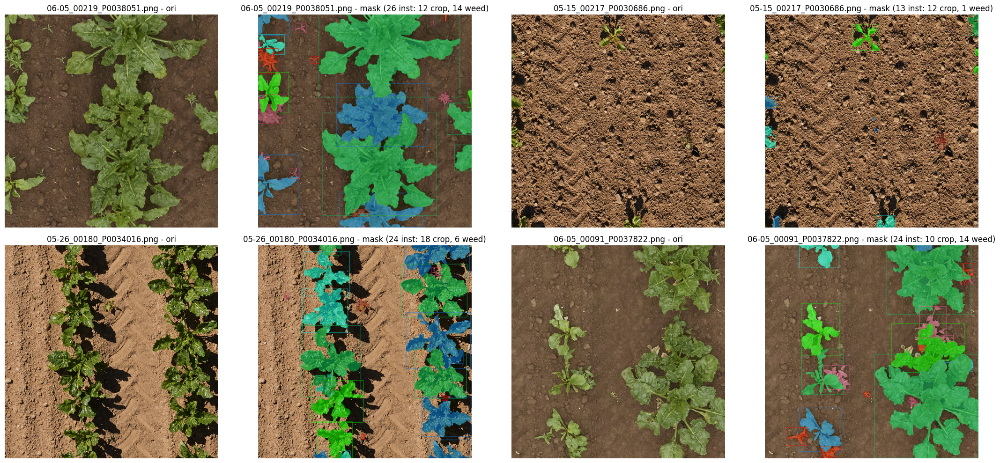

In [ ]:
import os
import json
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob

# --- Paths ---
image_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val"
json_path = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_val.json"

# --- Colors per class ---
CROP_COLORS = [(0, 255, 0), (0, 255, 255), (0, 128, 255), (0, 200, 100)]
WEED_COLORS = [(255, 0, 0), (255, 100, 180), (165, 42, 42), (200, 50, 120)]

def get_color(cls_id):
    return random.choice(CROP_COLORS if cls_id == 0 else WEED_COLORS)

# --- Load COCO JSON ---
with open(json_path, "r") as f:
    coco = json.load(f)

image_id_map = {img['id']: img['file_name'] for img in coco['images']}
annotations_per_image = {}
for ann in coco['annotations']:
    img_id = ann['image_id']
    annotations_per_image.setdefault(img_id, []).append(ann)

# --- Pick random 4 images ---
random_img_ids = random.sample(list(image_id_map.keys()), 4)

fig, axes = plt.subplots(2, 4, figsize=(22, 10))

for i, img_id in enumerate(random_img_ids):
    filename = image_id_map[img_id]
    img_path = os.path.join(image_dir, filename)
    img = cv2.imread(img_path)
    if img is None:
        print(f"⚠️ Failed to load: {img_path}")
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    overlay = img.copy()
    h, w = img.shape[:2]

    anns = annotations_per_image.get(img_id, [])
    count_crop = 0
    count_weed = 0

    for ann in anns:
        cls_id = ann["category_id"]
        if cls_id == 0:
            count_crop += 1
        elif cls_id == 1:
            count_weed += 1

        seg = ann["segmentation"][0]
        coords = np.array(seg).reshape(-1, 2).astype(np.int32)
        if len(coords) < 3:
            continue

        color = get_color(cls_id)
        cv2.fillPoly(overlay, [coords], color)
        x_min, y_min = coords.min(axis=0)
        x_max, y_max = coords.max(axis=0)
        cv2.rectangle(overlay, (x_min, y_min), (x_max, y_max), color, 2)

    blended = cv2.addWeighted(img, 0.5, overlay, 0.5, 0)
    total = count_crop + count_weed

    row, col = i // 2, (i % 2) * 2
    axes[row, col].imshow(img)
    axes[row, col].set_title(f"{filename} - ori")
    axes[row, col].axis("off")

    axes[row, col + 1].imshow(blended)
    axes[row, col + 1].set_title(f"{filename} - mask ({total} inst: {count_crop} crop, {count_weed} weed)")
    axes[row, col + 1].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
# STEP 1: Install compatible PyTorch (2.0.1 + CUDA 11.7)
!pip install torch==2.0.1 torchvision torchaudio --index-url https://download.pytorch.org/whl/cu117

# STEP 2: Install OpenMMLab tools
!pip install -U openmim
!mim install "mmengine>=0.7.4"
!mim install "mmcv==2.1.0"

# STEP 3: Clone MMDetection & install
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection
!pip install -e .

In [ ]:
# STEP 4: Final check
!python -c "import torch; import mmcv; import mmdet; print('PyTorch:', torch.__version__); print('MMCV:', mmcv.__version__); print('MMDet:', mmdet.__version__)"

PyTorch: 2.0.1+cu117
MMCV: 2.1.0
MMDet: 3.3.0


In [ ]:
!pip install numpy==1.24.4

In [ ]:
!ls mmdetection/configs/rtmdet/

classification			    rtmdet_l_convnext_b_4xb32-100e_coco.py
metafile.yml			    rtmdet_l_swin_b_4xb32-100e_coco.py
README.md			    rtmdet_l_swin_b_p6_4xb16-100e_coco.py
rtmdet-ins_l_8xb32-300e_coco.py     rtmdet_m_8xb32-300e_coco.py
rtmdet-ins_m_8xb32-300e_coco.py     rtmdet_s_8xb32-300e_coco.py
rtmdet_ins_m_pheno.py		    rtmdet_tiny_8xb32-300e_coco.py
rtmdet-ins_s_8xb32-300e_coco.py     rtmdet_tta.py
rtmdet-ins_tiny_8xb32-300e_coco.py  rtmdet_x_8xb32-300e_coco.py
rtmdet-ins_x_8xb16-300e_coco.py     rtmdet_x_p6_4xb8-300e_coco.py
rtmdet_l_8xb32-300e_coco.py


In [ ]:
custom_cfg = """
_base_ = 'rtmdet-ins_m_8xb32-300e_coco.py'

# Custom classes
dataset_type = 'CocoDataset'
metainfo = dict(classes=('crop', 'weed'))
num_classes = 2

# Paths
data_root = '/content/gdrive/MyDrive/yolov9-main/datasets/'
train_ann = data_root + 'PhenoBenchYOLOv9/annotations/instances_train.json'
val_ann = data_root + 'PhenoBenchYOLOv9/annotations/instances_val.json'
train_img = data_root + 'PhenoBench_COCO_Panoptic_Plant/train/'
val_img = data_root + 'PhenoBench_COCO_Panoptic_Plant/val/'

# Normalization
img_norm_cfg = dict(mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)

# Pipelines
train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations', with_bbox=True, with_mask=True),
    dict(type='Resize', scale=(512, 512), keep_ratio=False),
    dict(type='RandomFlip', prob=0.5),
    dict(type='Pad', size=(512, 512), pad_val=dict(img=(114, 114, 114))),
    dict(type='PackDetInputs')
]

test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='Resize', scale=(512, 512), keep_ratio=False),
    dict(type='Pad', size=(512, 512), pad_val=dict(img=(114, 114, 114))),
    dict(type='LoadAnnotations', with_bbox=True, with_mask=True),
    dict(type='PackDetInputs', meta_keys=('img_id', 'img_path', 'ori_shape', 'img_shape', 'scale_factor'))
]

# Data loader
train_dataloader = dict(
    batch_size=32,
    num_workers=8,
    dataset=dict(
        type=dataset_type,
        data_root=data_root,
        ann_file=train_ann,
        data_prefix=dict(img=train_img),
        filter_cfg=dict(filter_empty_gt=True, min_size=32),
        pipeline=train_pipeline,
        metainfo=dict(classes=('crop', 'weed')),
    )
)

val_dataloader = dict(
    batch_size=16,
    num_workers=8,
    dataset=dict(
        type=dataset_type,
        data_root=data_root,
        ann_file=val_ann,
        data_prefix=dict(img=val_img),
        pipeline=test_pipeline,
        test_mode=True,
        metainfo=dict(classes=('crop', 'weed')),
    )
)

test_dataloader = val_dataloader

# Evaluator
#val_evaluator = dict(type='CocoMetric', ann_file=val_ann, metric=['bbox', 'segm'])
val_evaluator = dict(type='CocoMetric', ann_file=val_ann, metric=['bbox', 'segm'], classwise=True)
test_evaluator = val_evaluator

# Model
#model = dict(bbox_head=dict(num_classes=num_classes))
model = dict(bbox_head=dict(num_classes=num_classes), test_cfg=dict(score_thr=0.5))

# Schedule
train_cfg = dict(type='EpochBasedTrainLoop', max_epochs=20, val_interval=1)
val_cfg = dict(type='ValLoop')
test_cfg = dict(type='TestLoop')

# Optimizer
optim_wrapper = dict(
    optimizer=dict(type='SGD', lr=0.01, momentum=0.9, weight_decay=0.0001),
    clip_grad=None
)

# Learning policy
param_scheduler = [
    dict(type='LinearLR', start_factor=0.1, by_epoch=False, begin=0, end=500),
    dict(
        type='MultiStepLR',
        begin=0,
        end=20,
        by_epoch=True,
        milestones=[15, 18],
        gamma=0.1
    )
]

# Logging and checkpointing
default_hooks = dict(
    logger=dict(type='LoggerHook', interval=4),
    checkpoint=dict(type='CheckpointHook', interval=4)
)

# Output path
work_dir = '/content/gdrive/MyDrive/yolov9-main/mmdetection/mmdet_outputs/rtmdet_ins_m_pheno'

# Load pretrained COCO model
load_from = 'https://download.openmmlab.com/mmdetection/v3.0/rtmdet/rtmdet-ins_m_8xb32-300e_coco/rtmdet-ins_m_8xb32-300e_coco_20221123_001039-6eba602e.pth'
"""

with open('mmdetection/configs/rtmdet/rtmdet_ins_m_pheno.py', 'w') as f:
    f.write(custom_cfg)

In [ ]:
!python mmdetection/tools/train.py mmdetection/configs/rtmdet/rtmdet_ins_m_pheno.py --amp

Disabling PyTorch because PyTorch >= 2.1 is required but found 2.0.1+cu117
07/15 15:26:16 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 993543192
    GPU 0: NVIDIA L4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.5, V12.5.82
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA 

In [ ]:
!python mmdetection/tools/test.py mmdetection/configs/rtmdet/rtmdet_ins_m_pheno.py mmdetection/mmdet_outputs/rtmdet_ins_m_pheno/epoch_20.pth

Disabling PyTorch because PyTorch >= 2.1 is required but found 2.0.1+cu117
07/17 18:44:30 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 1011422508
    GPU 0: NVIDIA L4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.5, V12.5.82
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA

In [ ]:
!python mmdetection/tools/test.py \
  mmdetection/configs/rtmdet/rtmdet_ins_m_pheno.py \
  mmdetection/mmdet_outputs/rtmdet_ins_m_pheno/epoch_20.pth \
  --show-dir pheno_seg_exp1

Disabling PyTorch because PyTorch >= 2.1 is required but found 2.0.1+cu117
07/17 19:30:47 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 2101597204
    GPU 0: NVIDIA L4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.5, V12.5.82
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA

In [ ]:
import os
folder_path = "/content/gdrive/MyDrive"

for file_name in os.listdir(folder_path):
    file_path = os.path.join(folder_path, file_name)
    if file_name.endswith(".png") and os.path.isfile(file_path):
        os.remove(file_path)

In [ ]:
import shutil
import os

src = "mmdetection/mmdet_outputs/rtmdet_ins_m_pheno/pheno_seg_exp1"
dst = "/content/gdrive/MyDrive/yolov9-main/mmdetection/mmdet_outputs/rtmdet_ins_m_pheno/pheno_seg_rtmdet_ins"

# First copy the folder and its contents
shutil.copytree(src, dst)

# Then delete the original
shutil.rmtree(src)

In [ ]:
!ls mmdetection/mmdet_outputs/rtmdet_ins_m_pheno/pheno_seg_rtmdet_ins | wc -l

772


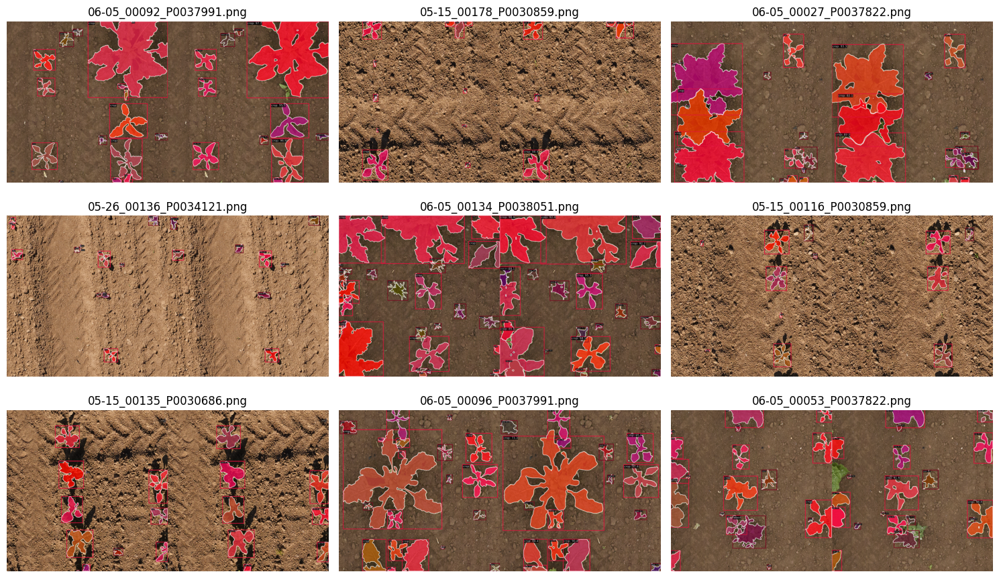

In [ ]:
import os
import random
import cv2
import matplotlib.pyplot as plt
from glob import glob

# --- Config ---
results_dir = "mmdetection/mmdet_outputs/rtmdet_ins_m_pheno/pheno_seg_rtmdet_ins"
num_images = 9  # Any number

# --- Get image paths ---
image_paths = sorted(glob(os.path.join(results_dir, "*.png")))
sampled_paths = random.sample(image_paths, min(num_images, len(image_paths)))

# --- Plotting ---
cols = 3
rows = (len(sampled_paths) + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 3))

# Flatten axes for easy indexing
axes = axes.flatten()

for i, img_path in enumerate(sampled_paths):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[i].imshow(img)
    axes[i].set_title(os.path.basename(img_path))
    axes[i].axis("off")

# Hide unused subplots if any
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
from mmdet.apis import init_detector, inference_detector
import mmcv

# Config and checkpoint paths
config_file = 'mmdetection/configs/rtmdet/rtmdet_ins_m_pheno.py'
checkpoint_file = 'mmdetection/mmdet_outputs/rtmdet_ins_m_pheno/epoch_20.pth'

# Initialize the model
model = init_detector(config_file, checkpoint_file, device='cuda:0')  # or 'cpu'

# Image path
img = '/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/06-05_00108_P0037822.png'

# Run inference
result = inference_detector(model, img)
print(result)

Disabling PyTorch because PyTorch >= 2.1 is required but found 2.0.1+cu117


Loads checkpoint by local backend from path: mmdetection/mmdet_outputs/rtmdet_ins_m_pheno/epoch_20.pth
<DetDataSample(

    META INFORMATION
    img_shape: (512, 512)
    scale_factor: (0.5, 0.5)
    ori_shape: (1024, 1024)
    img_path: '/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/06-05_00108_P0037822.png'
    pad_shape: (512, 512)
    img_id: 0
    batch_input_shape: (512, 512)

    DATA FIELDS
    gt_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            bboxes: tensor([], device='cuda:0', size=(0, 4))
            masks: BitmapMasks(num_masks=0, height=1024, width=1024)
            labels: tensor([], device='cuda:0', dtype=torch.int64)
        ) at 0x7b4474085350>
    pred_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            priors: tensor([[320., 384.,  16.,  16.],
                        [320., 160.,  16.,  16.],
                        

/usr/local/lib/python3.11/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Loads checkpoint by local backend from path: mmdetection/mmdet_outputs/rtmdet_ins_m_pheno/epoch_20.pth


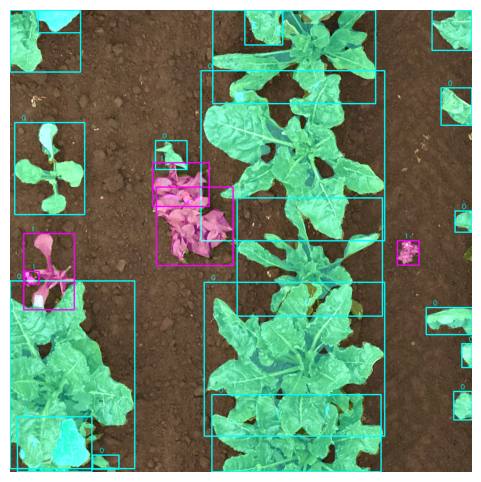

In [ ]:
from mmdet.apis import init_detector, inference_detector
import mmcv
import cv2
import matplotlib.pyplot as plt
import torch
import numpy as np

# Class labels
CLASS_LABELS = ["0", "1"]

PRED_COLORS = {0: (255, 255, 0),  # Cyan (Crop)
               1: (255, 0, 255)}  # Magenta (Weed)

# Config and checkpoint paths
config_file = 'mmdetection/configs/rtmdet/rtmdet_ins_m_pheno.py'
checkpoint_file = 'mmdetection/mmdet_outputs/rtmdet_ins_m_pheno/epoch_20.pth'

# Initialize the model
model = init_detector(config_file, checkpoint_file, device='cuda:0')  # or 'cpu'

def draw_bbox_with_label(img, bbox, label, color=(0, 0, 255), thickness=2):
    xmin, ymin, xmax, ymax = map(int, bbox)
    # Draw rectangle
    cv2.rectangle(img, (xmin, ymin), (xmax, ymax), color, thickness)
    # Put label text
    cv2.putText(
        img, label, (xmin + 15, ymin - 5),
        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 0), 1, cv2.LINE_AA
    )

# Image path
img_path = '/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/06-05_00108_P0037822.png'
img = cv2.imread(img_path)
if img is None:
    raise Exception("Image not found or unreadable")

# Run inference
results = inference_detector(model, img_path)

# Access the prediction results from the DetDataSample object
pred_instances = results.pred_instances

CONF_THRESHOLD = 0.3
img_with_masks = img.copy()

# Draw boxes and labels
# pred_instances.bboxes, pred_instances.scores, and pred_instances.labels are tensors
for i in range(len(pred_instances.bboxes)):
    score = pred_instances.scores[i]
    if score < CONF_THRESHOLD:
        continue

    # 1. Get Class and Color
    label_id = pred_instances.labels[i].item()
    class_name = CLASS_LABELS[label_id]
    color = PRED_COLORS[label_id]

    # 2. Extract and Process Mask
    # pred_instances.masks is a boolean tensor of shape (N, H, W)
    mask = pred_instances.masks[i].cpu().numpy()

    # Create a colored version of the mask
    colored_mask = np.zeros_like(img, dtype=np.uint8)
    colored_mask[mask] = color

    # 3. Overlay Mask onto Image (Alpha Blending)
    alpha = 0.4  # Transparency level
    img_with_masks = cv2.addWeighted(img_with_masks, 1.0, colored_mask, alpha, 0)

    # 4. Draw Bounding Box and Label
    bbox = pred_instances.bboxes[i].tolist()
    draw_bbox_with_label(img_with_masks, bbox, class_name, color=color)

# Show result
img_with_bbox_rgb = cv2.cvtColor(img_with_masks, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(6, 6))
plt.axis('off')
plt.imshow(img_with_bbox_rgb)
plt.show()

In [2]:
!pip install onnx onnxscript

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.5/17.5 MB 112.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 689.1/689.1 kB 70.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 118.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 159.3/159.3 kB 29.0 MB/s eta 0:00:00
  Attempting uninstall: ml_dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.18.0 requires ml-dtypes<0.5.0,>=0.4.0, but you have ml-dtypes 0.5.4 which is incompatible.


In [4]:
import torch

In [5]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(device)

cuda


In [ ]:
dummy_input = torch.randn(1, 3, 512, 512).to(device)
onnx_model_path = "mmdetection/mmdet_outputs/rtmdet_ins_m_pheno/epoch_20.onnx"
torch.onnx.export(
    model,
    dummy_input,
    onnx_model_path,
    opset_version=13,
    input_names=["input"],
    output_names=["boxes", "labels", "scores"],
    dynamic_axes={
        "input": {0: "batch_size", 2: "height", 3: "width"},
        "boxes": {0: "num_boxes"},
        "labels": {0: "num_boxes"},
        "scores": {0: "num_boxes"},
    },
    do_constant_folding=True,
)
print(f"ONNX export {onnx_model_path} completed successfully!")

============= Diagnostic Run torch.onnx.export version 2.0.1+cu117 =============
verbose: False, log level: Level.ERROR
======================= 0 NONE 0 NOTE 0 WARNING 0 ERROR ========================

ONNX export mmdetection/mmdet_outputs/rtmdet_ins_m_pheno/epoch_20.onnx completed successfully!


In [6]:
!pip install onnxruntime-gpu

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 252.6/252.6 MB 6.8 MB/s eta 0:00:00


In [143]:
import onnxruntime
import numpy as np
import cv2
import torch
import os
import random

# Load image and preprocess
img_path = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/06-05_00108_P0037822.png"

mean = np.array([123.675, 116.28, 103.53], dtype=np.float32)
std = np.array([58.395, 57.12, 57.375], dtype=np.float32)

img = cv2.imread(img_path)
img_resized = cv2.resize(img, (512, 512))
img_input = (img_resized[:, :, ::-1].astype(np.float32) - mean) / std
img_input = img_input.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

# Run inference
session = onnxruntime.InferenceSession("mmdetection/mmdet_outputs/rtmdet_ins_m_pheno/epoch_20.onnx", providers=["CUDAExecutionProvider"])
input_name = session.get_inputs()[0].name
outputs = session.run(None, {input_name: img_input})

# outputs is a list, often like [boxes, scores, keypoints]
print("Output:", [o.shape for o in outputs])

Output: [(1, 2, 64, 64), (1, 2, 32, 32), (1, 2, 16, 16), (1, 4, 64, 64), (1, 4, 32, 32), (1, 4, 16, 16), (1, 169, 64, 64), (1, 169, 32, 32), (1, 169, 16, 16), (1, 8, 64, 64)]


In [144]:
for i, o in enumerate(outputs): print(f"Idx {i}: Max={o.max():.2f}, Min={o.min():.2f}, Shape={o.shape}")

Idx 0: Max=1.61, Min=-11.56, Shape=(1, 2, 64, 64)
Idx 1: Max=3.01, Min=-11.03, Shape=(1, 2, 32, 32)
Idx 2: Max=-3.13, Min=-4.88, Shape=(1, 2, 16, 16)
Idx 3: Max=140.09, Min=0.00, Shape=(1, 4, 64, 64)
Idx 4: Max=192.51, Min=0.00, Shape=(1, 4, 32, 32)
Idx 5: Max=322.09, Min=0.08, Shape=(1, 4, 16, 16)
Idx 6: Max=11.82, Min=-14.49, Shape=(1, 169, 64, 64)
Idx 7: Max=8.92, Min=-9.95, Shape=(1, 169, 32, 32)
Idx 8: Max=9.37, Min=-9.26, Shape=(1, 169, 16, 16)
Idx 9: Max=5.55, Min=-1.37, Shape=(1, 8, 64, 64)


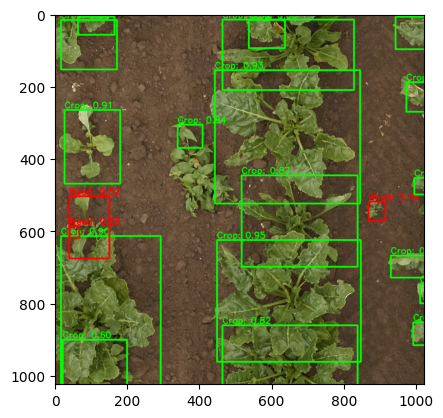

In [145]:
import cv2
import numpy as np
import os
import random
from matplotlib import pyplot as plt

CONF_THR = 0.5
IOU_THR = 0.3

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def decode_rtmdet(outputs, conf_threshold=0.2):
    strides = [8, 16, 32]
    all_boxes = []
    all_scores = []
    all_labels = []

    for i, stride in enumerate(strides):
        # 1. Scores (Indices 0, 1, 2)
        # Shape: (1, 2, H, W) -> (H*W, 2)
        score_map = outputs[i][0].reshape(2, -1).transpose(1, 0)
        score_map = 1 / (1 + np.exp(-score_map)) # Sigmoid

        # 2. Bboxes (Indices 3, 4, 5)
        # Shape: (1, 4, H, W) -> (H*W, 4)
        bbox_map = outputs[i+3][0].reshape(4, -1).transpose(1, 0)

        # Create Grid
        h, w = outputs[i].shape[2:]
        y, x = np.meshgrid(np.arange(h), np.arange(w), indexing='ij')
        grid = np.stack([x, y], axis=-1).reshape(-1, 2)

        # Shift grid to center of pixel and scale by stride
        # RTMDet predicts from the center of the grid cell
        grid_coords = (grid + 0.5) * stride

        # 3. Filter by threshold early for performance
        max_scores = np.max(score_map, axis=1)
        valid_indices = np.where(max_scores > conf_threshold)[0]

        for idx in valid_indices:
            s = max_scores[idx]
            l = np.argmax(score_map[idx])

            # LTRB values
            # Note: In some RTMDet exports, these are already stride-scaled.
            # If boxes are huge, remove the "* stride" below.
            dist = bbox_map[idx] # [left, top, right, bottom]

            cx, cy = grid_coords[idx]

            x1 = cx - dist[0]
            y1 = cy - dist[1]
            x2 = cx + dist[2]
            y2 = cy + dist[3]

            all_boxes.append([x1, y1, x2, y2])
            all_scores.append(s)
            all_labels.append(l)

    return np.array(all_boxes), np.array(all_scores), np.array(all_labels)

# 1. Run Decoding
boxes, scores, labels = decode_rtmdet(outputs, conf_threshold=CONF_THR)

orig_h, orig_w = img.shape[:2]
scale_w = orig_w / 512.0
scale_h = orig_h / 512.0

# 2. Post-Process
if len(boxes) > 0:
    # Convert to [x, y, w, h] for cv2.dnn.NMSBoxes
    nms_boxes = boxes.copy()
    nms_boxes[:, 2] = boxes[:, 2] - boxes[:, 0] # w
    nms_boxes[:, 3] = boxes[:, 3] - boxes[:, 1] # h

    indices = cv2.dnn.NMSBoxes(nms_boxes.tolist(), scores.tolist(), CONF_THR, IOU_THR)

    canvas = img.copy()
    for i in indices:
        # Get index - handle different OpenCV versions returning nested list
        idx = i[0] if isinstance(i, (list, np.ndarray)) else i

        # Rescale coordinates back to original size
        x1 = int(boxes[idx][0] * scale_w)
        y1 = int(boxes[idx][1] * scale_h)
        x2 = int(boxes[idx][2] * scale_w)
        y2 = int(boxes[idx][3] * scale_h)

        # Color: Green for Crop (0), Red for Weed (1)
        color = (0, 255, 0) if labels[idx] == 0 else (0, 0, 255)

        # DRAWING
        cv2.rectangle(canvas, (x1, y1), (x2, y2), color, 3)
        cv2.putText(canvas, f"{'Crop' if labels[idx]==0 else 'Weed'}: {scores[idx]:.2f}", (x1, y1-5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)

else:
    print("No detections found.")

plt.imshow(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))
plt.show()

In [146]:
print("scores max:", scores.max())
print("scores mean:", scores.mean())
print("scores > 0.5:", (scores > 0.5).sum())

scores max: 0.9529422
scores mean: 0.72723454
scores > 0.5: 191


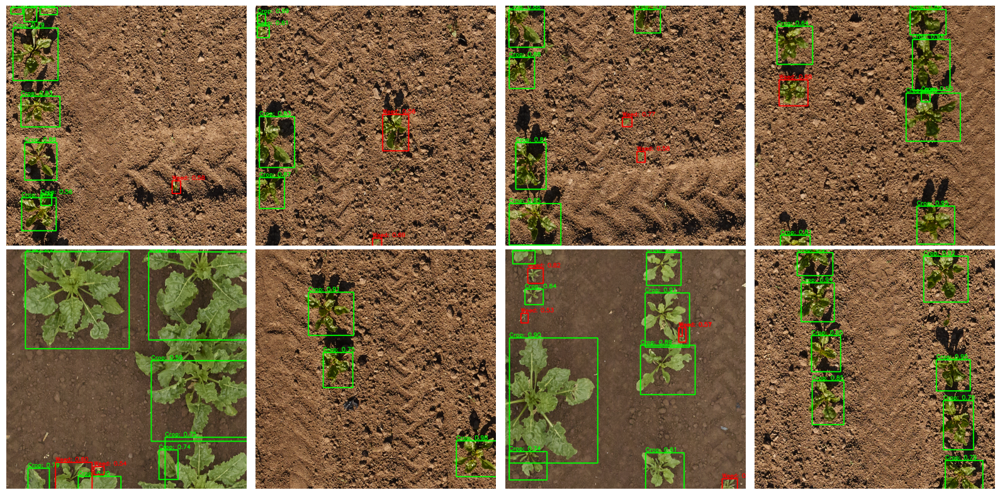

In [147]:
mean = np.array([123.675, 116.28, 103.53], dtype=np.float32)
std = np.array([58.395, 57.12, 57.375], dtype=np.float32)

session = onnxruntime.InferenceSession("mmdetection/mmdet_outputs/rtmdet_ins_m_pheno/epoch_20.onnx", providers=["CUDAExecutionProvider"])
input_name = session.get_inputs()[0].name

CONF_THR = 0.5
IOU_THR = 0.3

# ---------------- CONFIG ----------------
val_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/"

# visualization layout
N = 8
cols = 4
rows = int(np.ceil(N / cols))

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

plt.figure(figsize=(4 * cols, 4 * rows))

for ii, image in enumerate(sample_imgs):
    plt.subplot(2, 4, ii+1)

    img = cv2.imread(image)
    img_resized = cv2.resize(img, (512, 512))
    img_input = (img_resized[:, :, ::-1].astype(np.float32) - mean) / std
    img_input = img_input.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

    outputs = session.run(None, {input_name: img_input})

    boxes, scores, labels = decode_rtmdet(outputs, conf_threshold=CONF_THR)

    orig_h, orig_w = img.shape[:2]
    scale_w = orig_w / 512.0
    scale_h = orig_h / 512.0

    # 2. Post-Process
    if len(boxes) > 0:
        # Convert to [x, y, w, h] for cv2.dnn.NMSBoxes
        nms_boxes = boxes.copy()
        nms_boxes[:, 2] = boxes[:, 2] - boxes[:, 0] # w
        nms_boxes[:, 3] = boxes[:, 3] - boxes[:, 1] # h

        indices = cv2.dnn.NMSBoxes(nms_boxes.tolist(), scores.tolist(), CONF_THR, IOU_THR)

        canvas = img.copy()
        for i in indices:
            # Get index - handle different OpenCV versions returning nested list
            idx = i[0] if isinstance(i, (list, np.ndarray)) else i

            # Rescale coordinates back to original size
            x1 = int(boxes[idx][0] * scale_w)
            y1 = int(boxes[idx][1] * scale_h)
            x2 = int(boxes[idx][2] * scale_w)
            y2 = int(boxes[idx][3] * scale_h)

            # Color: Green for Crop (0), Red for Weed (1)
            color = (0, 255, 0) if labels[idx] == 0 else (0, 0, 255)

            # DRAWING
            cv2.rectangle(canvas, (x1, y1), (x2, y2), color, 3)
            cv2.putText(canvas, f"{'Crop' if labels[idx]==0 else 'Weed'}: {scores[idx]:.2f}", (x1, y1-5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)

    else:
        print("No detections found.")

    plt.subplot(rows, cols, ii + 1)
    plt.imshow(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))
    plt.axis("off")

plt.tight_layout()
plt.show()